In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import json
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.image as mpimg
from skimage import color
import os

In [2]:
train_images = pd.read_csv('/kaggle/input/cassava-leaf-disease-classification/train.csv')
sample_sub = pd.read_csv('/kaggle/input/cassava-leaf-disease-classification/sample_submission.csv')
TRAIN_IMAGES_PATH = '/kaggle/input/cassava-leaf-disease-classification/train_images'
TEST_IMAGES_PATH = '../input/cassava-leaf-disease-classification/test_images'

with open('../input/cassava-leaf-disease-classification/label_num_to_disease_map.json') as json_data:
    label_map = json.load(json_data)

In [3]:
train_images.head()

,image_id,label
0,1000015157.jpg,0
1,1000201771.jpg,3
2,100042118.jpg,1
3,1000723321.jpg,1
4,1000812911.jpg,3


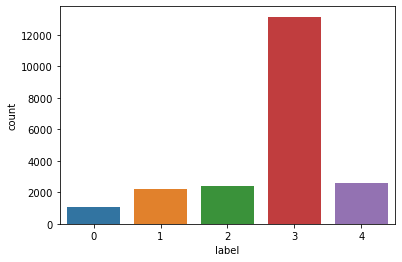

In [4]:
sns.countplot(train_images['label'])

This plot indicates that we have a class imbalance in the dataset.

In [5]:
label_map

{'0': 'Cassava Bacterial Blight (CBB)',
 '1': 'Cassava Brown Streak Disease (CBSD)',
 '2': 'Cassava Green Mottle (CGM)',
 '3': 'Cassava Mosaic Disease (CMD)',
 '4': 'Healthy'}

In [6]:
def select_imgs(n, label):
    '''Function to select random ids from the dataframe given a particular label'''
    t = train_images[train_images['label'] == label]
    img_ids = t.sample(n = n, random_state = 0)['image_id']
    return list(img_ids)

def plot_images(df, ids, label = None):
    '''Plots an even number of images in 2 rows'''
    n = len(ids)
    fig, ax = plt.subplots(2, n//2, figsize = (20,10))
    for i, im_id in enumerate(ids):
        img = mpimg.imread(os.path.join(TRAIN_IMAGES_PATH, im_id))
        ax[i//(n//2)][i%(n//2)].imshow(img)
        ax[i//(n//2)][i%(n//2)].axis('off')
    plt.tight_layout()
    if label is not None:
        plt.suptitle(label_map[str(label)])
    plt.show()

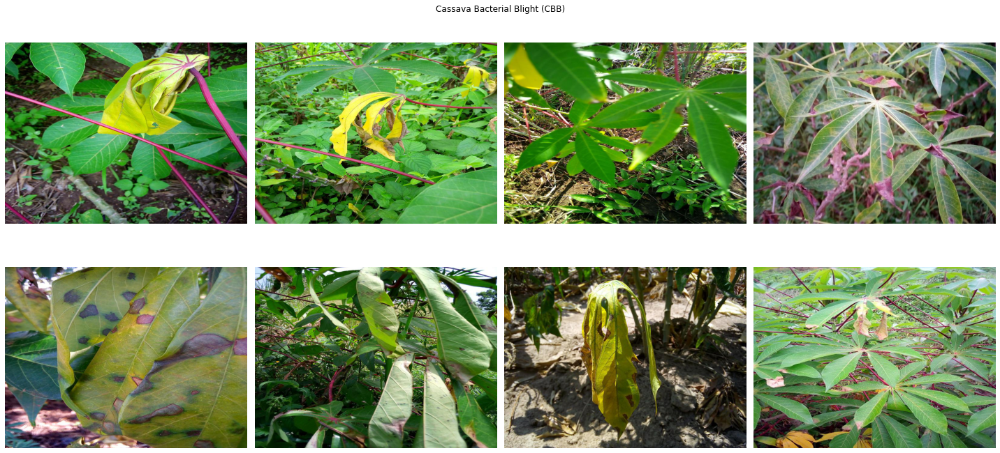

In [7]:
#some label 0 images
plot_images(train_images, select_imgs(8, 0), 0)

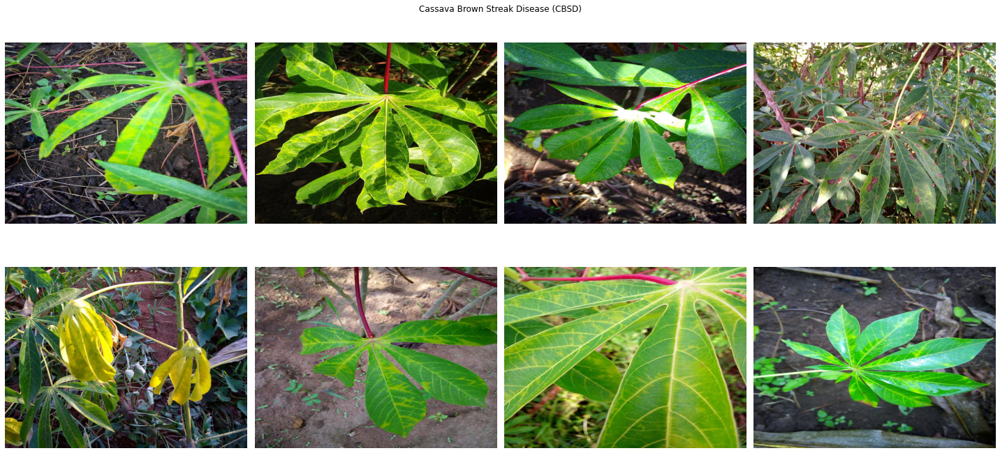

In [8]:
#some label 1 images
plot_images(train_images, select_imgs(8, 1), 1)

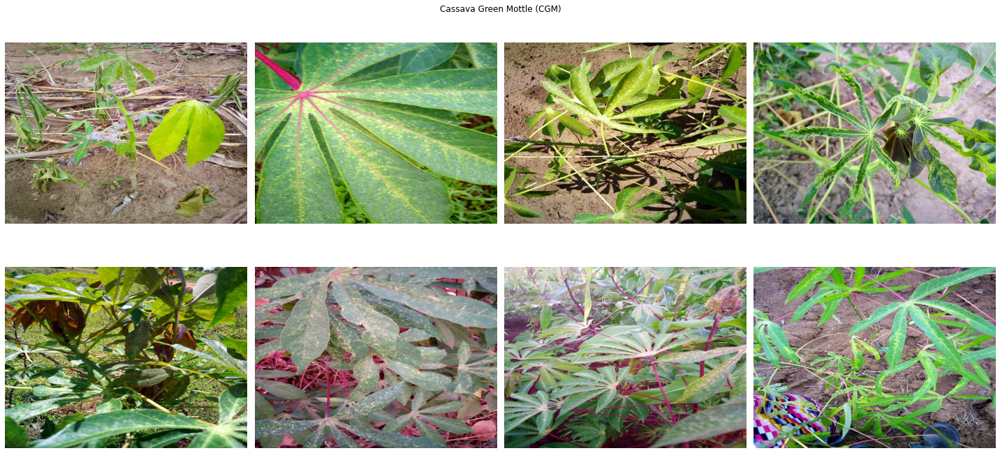

In [9]:
#some label 2 images
plot_images(train_images, select_imgs(8, 2), 2)

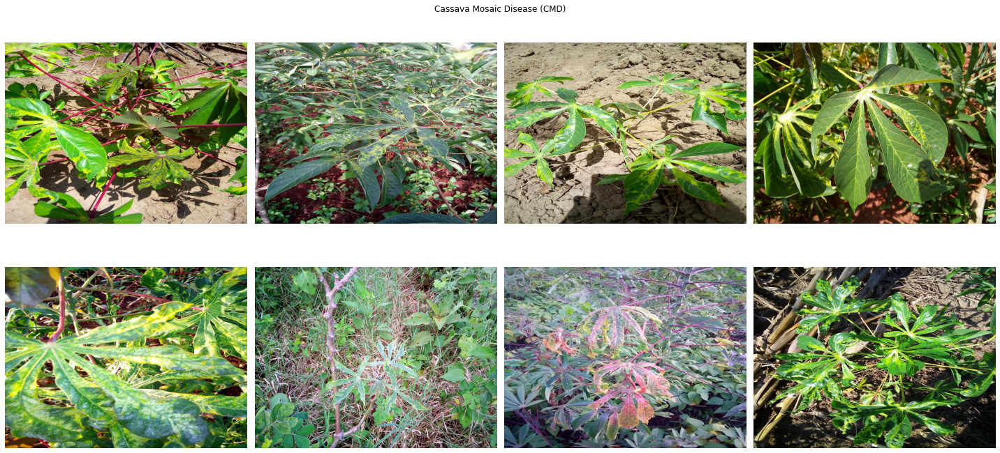

In [10]:
#some label 3 images
plot_images(train_images, select_imgs(8, 3), 3)

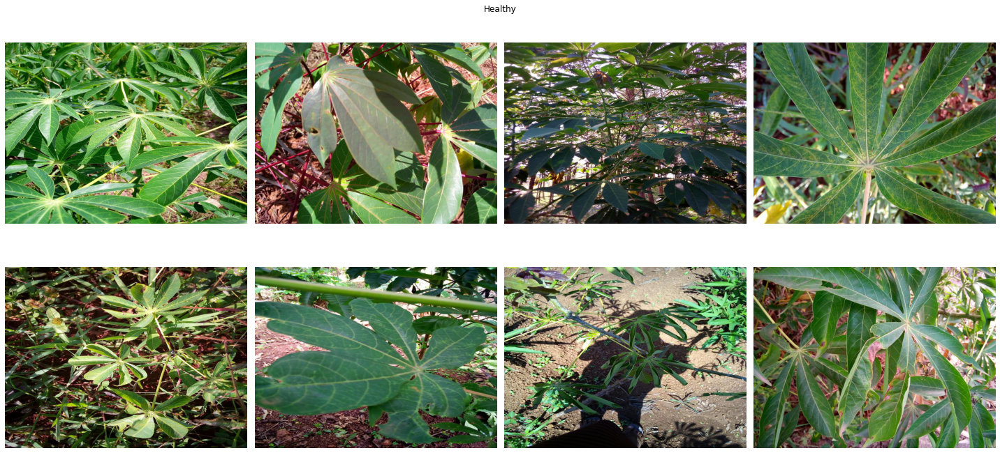

In [11]:
#some label 4 images
plot_images(train_images, select_imgs(8, 4), 4)

Looking at these images we realise that the colour of the diseased leaves is one of the key identifiers of the disease. Training networks with grayscale images may not perform well.

We shall now illustrate the differences in the brightness across all images.

In [12]:
def get_brightness(image):
    image = color.rgb2gray(image)
    return np.mean(image)*255

#get brightness of each image and append to dataframe
brightness_array = []
image_list = list(train_images['image_id'].unique())
for img in image_list:
    image = mpimg.imread(os.path.join(TRAIN_IMAGES_PATH, img))
    brightness = get_brightness(image)
    brightness_array.append(brightness)

df = pd.DataFrame({'image_id': image_list,
                         'brightness': brightness_array})

In [13]:
print('Mean Brightness is: ', df['brightness'].mean())

Mean Brightness is:  119.69826516980143


In [14]:
print('Max Brightness is: ', df['brightness'].max())

Max Brightness is:  219.8218077604166


In [15]:
print('Min Brightness is: ', df['brightness'].min())

Min Brightness is:  39.63946992291668


(array([2.800e+01, 2.020e+02, 1.640e+03, 5.875e+03, 6.364e+03, 6.013e+03,
        1.230e+03, 4.300e+01, 1.000e+00, 1.000e+00]),
 array([ 39.63946992,  57.65770371,  75.67593749,  93.69417127,
        111.71240506, 129.73063884, 147.74887263, 165.76710641,
        183.78534019, 201.80357398, 219.82180776]),
 <a list of 10 Patch objects>)

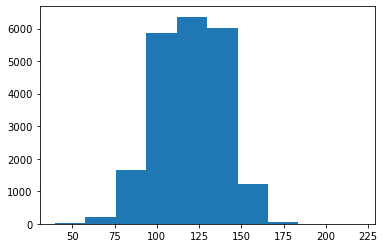

In [16]:
plt.hist(df['brightness'])

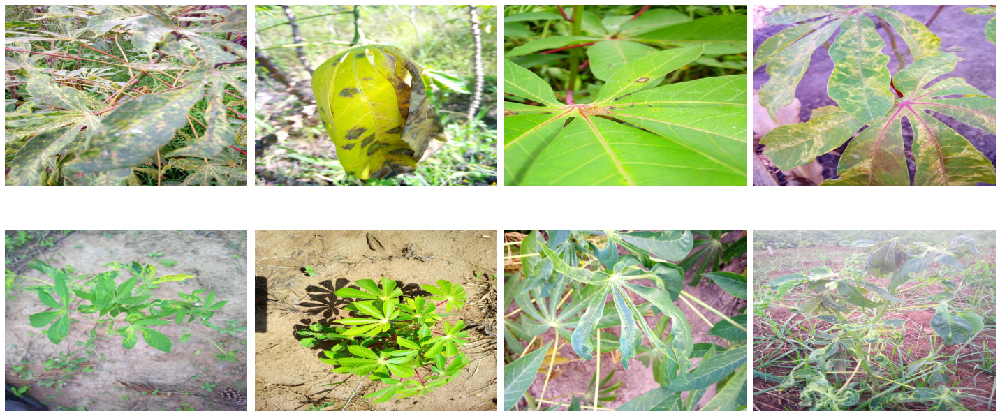

In [17]:
#bright images
bright_ids = df[df['brightness'] > 160].image_id
plot_images(train_images, bright_ids[0:8])

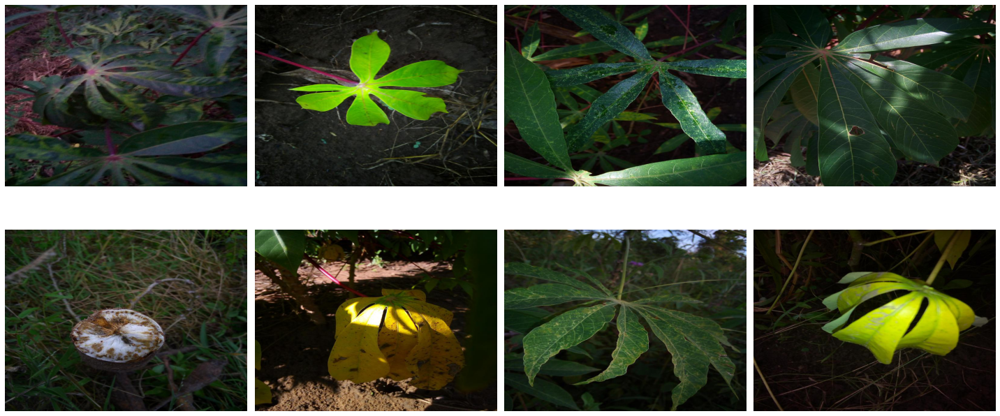

In [18]:
#dark ids
dark_ids = df[df['brightness'] < 50].image_id
plot_images(train_images, dark_ids[0:8])